## Exploratory Data Analysis (EDA)



### 1.1 Опис даних

У цьому розділі я проводжу базовий огляд датасету:

- визначаю розмір вибірки (кількість рядків і стовпців);
- аналізую типи змінних (числові, категоріальні);
- роблю переіменування стовбців на більш зрозумілі
- перевіряю наявність пропусків та службових значень типу `unknown`;
- перевіряю данні на наявність дублікатів
- отримую первинні статистики для числових ознак.

Це дозволяє зрозуміти структуру даних, можливі проблеми якості
та визначити подальші кроки перед детальним EDA і моделюванням.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/ML Engineering /bank-additional-full.csv', sep=';')
df['duration_min']=df['duration']/60

df = df.rename(columns={
    'previous': 'previouscalls',
    'default': 'defaultcredit',
    'pdays': 'days_after_lastcontact',
    'poutcome': 'result_lastcampaign',
    'housing': 'mortgage',
    'campaign':'current_camp_calls'
})
df.iloc[10:15]

,age,job,marital,education,defaultcredit,mortgage,loan,contact,month,day_of_week,...,days_after_lastcontact,previouscalls,result_lastcampaign,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,duration_min
10,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0.916667
11,25,services,single,high.school,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,3.700000
12,29,blue-collar,single,high.school,no,no,yes,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,2.283333
13,57,housemaid,divorced,basic.4y,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,4.883333
14,35,blue-collar,married,basic.6y,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,2.433333


In [3]:
n_rows, n_cols = df.shape
print(f'Number of records: {n_rows}')
print(f'Number of features:   {n_cols}')

Number of records: 41188
Number of features:   22


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   age                     41188 non-null  int64  
 1   job                     41188 non-null  object 
 2   marital                 41188 non-null  object 
 3   education               41188 non-null  object 
 4   defaultcredit           41188 non-null  object 
 5   mortgage                41188 non-null  object 
 6   loan                    41188 non-null  object 
 7   contact                 41188 non-null  object 
 8   month                   41188 non-null  object 
 9   day_of_week             41188 non-null  object 
 10  duration                41188 non-null  int64  
 11  current_camp_calls      41188 non-null  int64  
 12  days_after_lastcontact  41188 non-null  int64  
 13  previouscalls           41188 non-null  int64  
 14  result_lastcampaign     41188 non-null

In [5]:
# Перевірка явних пропусків (NaN)
missing_counts = df.isna().sum().sort_values(ascending=False)
missing_counts[missing_counts > 0]

,0


In [6]:
# Перевірка дублікатів
df.duplicated(subset=[col for col in df.columns if col != 'duration']).sum()

np.int64(12)

In [ ]:
df[df.duplicated(keep=False)].sort_values(by=df.columns.tolist())

,age,job,marital,education,defaultcredit,mortgage,loan,contact,month,day_of_week,...,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,duration_min,y_bin,was_contacted_before,current_camp_calls_clipped


Знайдено 12 повних дублів рядків. Оскільки дані не містять client_id, а ймовірність випадкового збігу за всіма 21 ознаками (включно з неперервними економічними показниками) вкрай мала, ці записи розцінені як технічні дублі та видалені.

In [7]:
#Видяліємо дублікати
df = df.drop_duplicates()

In [8]:
# Розділення ознак на числові та категоріальні
num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_cols = df.select_dtypes(include=['object']).columns.tolist()

print('Числові ознаки:')
print(num_cols)
print('\nКатегоріальні ознаки:')
print(cat_cols)

Числові ознаки:
['age', 'duration', 'current_camp_calls', 'days_after_lastcontact', 'previouscalls', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'duration_min']

Категоріальні ознаки:
['job', 'marital', 'education', 'defaultcredit', 'mortgage', 'loan', 'contact', 'month', 'day_of_week', 'result_lastcampaign', 'y']


In [9]:
# Перевірка прихованих пропусків виду 'unknown' у категоріальних ознаках
for col in cat_cols:
    if 'unknown' in df[col].unique():
        share_unknown = (df[col] == 'unknown').mean() * 100
        print(f'{col}: частка "unknown" = {share_unknown:.2f}%')

job: частка "unknown" = 0.80%
marital: частка "unknown" = 0.19%
education: частка "unknown" = 4.20%
defaultcredit: частка "unknown" = 20.88%
mortgage: частка "unknown" = 2.40%
loan: частка "unknown" = 2.40%


In [10]:
df['y_bin'] = (df['y'] == 'yes').astype(int)

df.groupby('defaultcredit')['y_bin'].agg(['mean', 'count'])

,mean,count
defaultcredit,,
no,0.128803,32577
unknown,0.051536,8596
yes,0.000000,3


У ряді категоріальних змінних присутні значення `'unknown'`, які відображають
відсутність інформації (аналог пропусків):

- `job`, `marital`, `education`, `mortgage`, `loan` мають невелику частку `'unknown'`
  (менше 5%), тому я розглядаю їх як окрему категорію. Такі значення залишаються
  в даних і надалі будуть закодовані звичайним one-hot encoding.

- Для змінної `defaultcredit` частка `'unknown'` становить ≈21%. У цьому випадку
  я не замінюю їх на моду, оскільки сама відсутність інформації може бути
  інформативною. Натомість:
  - залишаємо "unknown" = нічого не робимо зі значенням і воно саме стане окремою колонкою при one-hot encoding
  - так як значень "yes" всього 3  - можемо його обєднати з unknown.


In [11]:
df['defaultcredit'] = df['defaultcredit'].replace({'yes': 'unknown'})
df.groupby('defaultcredit')['y_bin'].agg(['mean', 'count'])

,mean,count
defaultcredit,,
no,0.128803,32577
unknown,0.051518,8599


### 1.2 Аналіз цільової змінної `y`

У цьому розділі я аналізую розподіл цільової змінної `y`, яка вказує, чи підписав клієнт строковий депозит (`yes` / `no`).

Мета:
- зрозуміти баланс класів (або його відсутність);
- кількісно оцінити частку позитивних відповідей;
- визначити наслідки для оцінки та навчання моделі (метрики, ресемплінг, стратифікація).

In [12]:
import plotly.express as px

target_counts = df['y'].value_counts().reset_index()
target_counts.columns = ['y', 'count']
target_counts['percentage'] = target_counts['count'] / target_counts['count'].sum() * 100

fig = px.bar(
    target_counts,
    x='y',
    y='count',
    text=target_counts['percentage'].map(lambda x: f'{x:.1f}%'),
    color='y',
    title='Distribution of target variable y',
)
fig.update_traces(textposition='outside')
fig.update_layout(yaxis_title='Count', xaxis_title='y')
fig.show()

Цільова змінна `y` є явно незбалансованою:

- Мажоритарний клас (`no`) становить приблизно 88,7% спостережень.
- Міноритарний клас (`yes`) становить лише 11,3% спостережень.

Це означає, що:
- Використання звичайної точності (accuracy) як основної метрики є оманливим, оскільки наївна модель,
  яка завжди прогнозує `no`, вже досягає високого значення accuracy.
- Для оцінки моделей я зосереджуся на **F1-score**,**F2-score**,**precision/recall**,**PR-AUC** та
  **ROC-AUC**, а згодом розгляну такі підходи:
  - `class_weight='balanced'` для лінійних моделей та дерев рішень,
  - методи ресемплінгу (наприклад, SMOTE, випадковий андерсемплінг) за потреби,
  - стратифікований train/test split, щоб зберегти початковий розподіл класів.


### 1.3 Одновимірний аналіз ознак

У цьому розділі я аналізую кожну ознаку окремо, без урахування зв'язку з цільовою змінною `y`.

Мета:

1. зрозуміти розподіл і масштаб числових змінних (наприклад, скошеність, викиди, типові діапазони);
2. дослідити частоту категорій для категоріальних змінних (домінуючі та рідкісні категорії, наявність `'unknown'`);
3. виявити потенційні проблеми якості даних (сильно скошені змінні, важкі хвости, рідкісні рівні) та можливості для feature engineering (біннінг, трансформації, групування категорій).

Цей univariate-огляд формує основу для подальшого bivariate-аналізу зі змінною `y` та для розробки відповідних кроків препроцесингу.


#### 1.3.1 Аналіз числових ознак

In [13]:
# Описова статистика для числових ознак
num_summary = df[num_cols].describe().T
num_summary

,count,mean,std,min,25%,50%,75%,max
age,41176.0,40.023800,10.420680,17.000,32.000,38.000,47.000000,98.000000
duration,41176.0,258.315815,259.305321,0.000,102.000,180.000,319.000000,4918.000000
current_camp_calls,41176.0,2.567879,2.770318,1.000,1.000,2.000,3.000000,56.000000
days_after_lastcontact,41176.0,962.464810,186.937102,0.000,999.000,999.000,999.000000,999.000000
previouscalls,41176.0,0.173013,0.494964,0.000,0.000,0.000,0.000000,7.000000
emp.var.rate,41176.0,0.081922,1.570883,-3.400,-1.800,1.100,1.400000,1.400000
cons.price.idx,41176.0,93.575720,0.578839,92.201,93.075,93.749,93.994000,94.767000
cons.conf.idx,41176.0,-40.502863,4.627860,-50.800,-42.700,-41.800,-36.400000,-26.900000
euribor3m,41176.0,3.621293,1.734437,0.634,1.344,4.857,4.961000,5.045000
nr.employed,41176.0,5167.034870,72.251364,4963.600,5099.100,5191.000,5228.100000,5228.100000


In [14]:
# Перевіряємо скошенність (skew) данних
skew_kurt = pd.DataFrame({
    'skew': df[num_cols].skew(),
    'kurtosis': df[num_cols].kurtosis()
}).sort_values('skew', ascending=False)

skew_kurt

,skew,kurtosis
current_camp_calls,4.762044,36.971857
previouscalls,3.831396,20.102164
duration_min,3.262808,20.243771
duration,3.262808,20.243771
age,0.784560,0.791113
cons.conf.idx,0.302876,-0.359097
cons.price.idx,-0.230853,-0.829851
euribor3m,-0.709194,-1.406791
emp.var.rate,-0.724061,-1.062698
nr.employed,-1.044317,-0.003540


Найбільш скошеними є current_camp_calls, previouscalls, duration (right-skewed, важкі хвости) — це підтверджує візуальні спостереження і вказує на потребу в лог-трансформації або клипінгу для лінійних моделей та kNN, тоді як дерева рішень і бустинг менш чутливі до цього. Екстремальний skew/kurtosis days_after_lastcontact пояснюється спеціальним кодом 999 і буде оброблений окремо через бінарний флаг was_contacted_before, а не як звичайна числова змінна

In [15]:
# Створюємо бінарний прапорець: чи контактували з клієнтом раніше
df['was_contacted_before'] = (df['days_after_lastcontact'] != 999).astype(int)

df['was_contacted_before'].value_counts()

,count
was_contacted_before,
0,39661
1,1515


In [16]:
import plotly.express as px

num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_cols = df.select_dtypes(include=['object']).columns.tolist()

print("Numeric features:", num_cols)
print("Categorical features:", cat_cols)

Numeric features: ['age', 'duration', 'current_camp_calls', 'days_after_lastcontact', 'previouscalls', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'duration_min', 'y_bin', 'was_contacted_before']
Categorical features: ['job', 'marital', 'education', 'defaultcredit', 'mortgage', 'loan', 'contact', 'month', 'day_of_week', 'result_lastcampaign', 'y']


In [17]:
# Прості гістограми для всіх числових ознак
for col in num_cols:
    fig = px.histogram(
        df,
        x=col,
        nbins=40,
        marginal='box',        # зверху/збоку додає boxplot
        opacity=0.8,
        title=f'Distribution of {col}',
    )
    fig.update_layout(
        template='plotly_white',
        xaxis_title=col,
        yaxis_title='Count',
    )
    fig.show()

In [ ]:
skewed_cols = ['duration', 'current_camp_calls','duration_min','previouscalls']

for col in skewed_cols:
    q95 = df[col].quantile(0.95)
    fig = px.histogram(
        df[df[col] <= q95],
        x=col,
        nbins=40,
        marginal='box',
        opacity=0.8,
        title=f'Distribution of {col} (truncated at 95th percentile)',
    )
    fig.update_layout(
        template='plotly_white',
        xaxis_title=col,
        yaxis_title='Count',
    )
    fig.show()

In [18]:
skewed_cols = ['duration', 'current_camp_calls', 'duration_min', 'previouscalls']

df[skewed_cols].quantile([0.95, 0.99, 0.999])

,duration,current_camp_calls,duration_min,previouscalls
0.950,753.000,7.0,12.55000,1.0
0.990,1271.250,14.0,21.18750,2.0
0.999,2176.125,29.0,36.26875,4.0


На основі аналізу квантилів для скошених числових ознак:
1. current_camp_calls демонструє найрізкіше зростання у хвості розподілу: від 7 дзвінків (95-й перцентиль) до 29 дзвінків (99.9-й перцентиль) — це майже 4-кратне зростання на останніх 5% спостережень. Такі значення розцінюються як аномальні (можливо, помилкові повторні дзвінки або нетипова поведінка кол-центру) і підлягають клипінгу по 99-му перцентилю (14 дзвінків) для лінійних моделей та kNN. Для Decision Tree та бустингу клипінг не застосовується, оскільки ці моделі стійкі до подібних викидів.
2. duration / duration_min також мають виражений правий хвіст (зростання у ~3 рази між 95-м і 99.9-м перцентилями), однак ця змінна не використовується у фінальній моделі через ризик data leakage (значення відоме лише після завершення дзвінка). Клипінг цієї ознаки не є пріоритетним, оскільки вона застосовується лише для baseline-порівняння моделей.
3. previouscalls має значно менший абсолютний розкид (від 1 до 4 дзвінків між 95-м і 99.9-м перцентилями), тому клипінг тут менш критичний. Альтернативним рішенням може бути групування значень у категорії (наприклад, 0 / 1 / 2+ дзвінків) замість клипінгу, оскільки більшість клієнтів мають 0-1 попередніх контактів.

**Підсумкове рішення**: клипінг по 99-му перцентилю застосовується лише до current_camp_calls (для лінійних моделей та kNN), інші скошені ознаки залишаються без змін на етапі EDA і будуть додатково розглянуті на етапі препроцесингу.

In [19]:
# Клипінг current_camp_calls по 99-му перцентилю
# (застосовується лише для лінійних моделей / kNN, дерева/бустинг не потребують)

cap_99 = df['current_camp_calls'].quantile(0.99)

df['current_camp_calls_clipped'] = df['current_camp_calls'].clip(upper=cap_99)

print(f'Поріг клипінгу (99-й перцентиль): {cap_99}')
print(f"Максимум до клипінгу: {df['current_camp_calls'].max()}")
print(f"Максимум після клипінгу: {df['current_camp_calls_clipped'].max()}")
print(f"Кількість змінених значень: {(df['current_camp_calls'] > cap_99).sum()}")

Поріг клипінгу (99-й перцентиль): 14.0
Максимум до клипінгу: 56
Максимум після клипінгу: 14
Кількість змінених значень: 406


#### 1.3.2 Аналіз категоріальних ознак

In [20]:
cat_cols = df.select_dtypes(include=['object']).columns.tolist()

# прибираємо цільову змінну зі списку категоріальних ознак
if 'y' in cat_cols:
    cat_cols.remove('y')

In [21]:
for col in cat_cols:
    vc = df[col].value_counts(normalize=True).reset_index()
    vc.columns = [col, 'percentage']
    vc['percentage'] *= 100

    top_k = 15
    vc_top = vc.head(top_k)

    fig = px.bar(
        vc_top,
        x=col,
        y='percentage',
        text=vc_top['percentage'].map(lambda x: f'{x:.1f}%'),
        title=f'Category percentages for {col} (top {top_k})',
    )
    fig.update_traces(textposition='outside')
    fig.update_layout(
        template='plotly_white',
        xaxis_title=col,
        yaxis_title='Percentage',
        xaxis_tickangle=-45,
    )
    fig.show()

1. Серед категоріальних ознак кілька категорій домінують у розподілі (наприклад, job = "blue-collar", job = "services", job = "admin.", education = "high.school", "university.degree"), тоді як деякі рівні є рідкісними і можуть потребувати групування з іншими категоріями.
2. Кілька категоріальних змінних містять значення 'unknown' як окремий рівень. Для більшості з них (job, marital, education, mortgage, loan) частка 'unknown' невелика (<5%), тому вони залишаються без змін і кодуються звичайним one-hot encoding.
3. Необхідно додатково перевірити наявність подібних рідкісних категорій (з малою кількістю спостережень) в інших категоріальних ознаках (job, education, month, day_of_week тощо) за допомогою value_counts(), оскільки категорії з дуже малою кількістю прикладів (аналогічно випадку з defaultcredit='yes') не дозволяють моделі виявити стійку закономірність і є кандидатами на групування з сусідніми категоріями.

In [22]:
cat_cols = df.select_dtypes(include=['object']).columns.tolist()
if 'y' in cat_cols:
    cat_cols.remove('y')

for col in cat_cols:
    print(f'--- {col} ---')
    vc = df[col].value_counts()
    print(vc)
    print(f'Мінімальна категорія: {vc.idxmin()} ({vc.min()} спостережень, {vc.min()/len(df)*100:.2f}%)')
    print()

--- job ---
job
admin.           10419
blue-collar       9253
technician        6739
services          3967
management        2924
retired           1718
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: count, dtype: int64
Мінімальна категорія: unknown (330 спостережень, 0.80%)

--- marital ---
marital
married     24921
single      11564
divorced     4611
unknown        80
Name: count, dtype: int64
Мінімальна категорія: unknown (80 спостережень, 0.19%)

--- education ---
education
university.degree      12164
high.school             9512
basic.9y                6045
professional.course     5240
basic.4y                4176
basic.6y                2291
unknown                 1730
illiterate                18
Name: count, dtype: int64
Мінімальна категорія: illiterate (18 спостережень, 0.04%)

--- defaultcredit ---
defaultcredit
no         32577
unknown     8599
Name: count, dtype: int64
Мініма

In [23]:
df.groupby('education')['y_bin'].agg(['mean', 'count'])

,mean,count
education,,
basic.4y,0.102490,4176
basic.6y,0.082060,2291
basic.9y,0.078246,6045
high.school,0.108389,9512
illiterate,0.222222,18
professional.course,0.113550,5240
university.degree,0.137208,12164
unknown,0.145087,1730


**Підсумковий висновок з категоріального аналізу:**

Аналіз частот категорій та їхнього зв'язку з цільовою змінною y дозволив виявити такі закономірності та прийняти рішення щодо подальшої обробки:

**Домінуючі та рідкісні категорії:**

У більшості категоріальних ознак (job, marital, mortgage, loan, contact, day_of_week, result_lastcampaign) розподіл категорій достатньо збалансований — навіть найменші категорії містять достатню кількість спостережень (від 80 до кількох тисяч) для надійного навчання моделі, тому додаткового групування не потребують.

Категорія education = 'illiterate' містить лише 18 спостережень і демонструє найвищий відсоток підписки на депозit (22.2%) серед усіх рівнів освіти — вищий навіть за university.degree (13.7%). Оскільки вибірка мала, цей результат може бути статистично ненадійним, проте оскільки категорія не показує 0% (на відміну від випадку defaultcredit='yes'), а демонструє напрямок, що не суперечить загальній логіці (можливий зв'язок з віком чи іншими факторами), рішення прийнято залишити illiterate без об'єднання з іншими категоріями, з відповідною позначкою в звіті про малий розмір вибірки та потребу обережної інтерпретації.
Обробка 'unknown' як окремої категорії:

Для ознак з невеликою часткою 'unknown' (job — 0.80%, marital — 0.19%, education — 4.20%, mortgage — 2.40%, loan — 2.40%) значення 'unknown' залишається без змін як окрема категорія та кодується звичайним one-hot encoding.

### 1.4 Зв'язок ознак з y

У цьому розділі я аналізую зв'язок кожної ознаки з цільовою змінною y, на відміну від попереднього розділу (1.3), де ознаки розглядались ізольовано.

**План розділу:**
1. Створення бінарної версії таргету (y_bin) — необхідно для подальших кількісних розрахунків (середні значення, кореляції), оскільки текстова колонка y не підтримує математичні операції.
2. Числові ознаки vs y (1.4.1) — порівняння розподілів числових змінних між групами y="yes" та y="no" за допомогою boxplot та накладених гістограм, щоб побачити, чи відрізняються медіани, розкид і форма розподілу між класами.
3. Категоріальні ознаки vs y (1.4.2) — розрахунок частки y="yes" для кожної категорії кожної категоріальної змінної, разом із кількістю спостережень у групі (щоб уникнути хибних висновків на малих вибірках, як це було з illiterate чи defaultcredit='yes').
4. Кореляція числових ознак з y (1.4.3) — теплова карта кореляції числових змінних із y_bin, щоб кількісно оцінити напрямок і силу зв'язку кожної ознаки з таргетом.
5. Мультиколінеарність числових ознак між собою (1.4.4) — окрема перевірка кореляції числових ознак одна з одною (а не лише з таргетом), що особливо важливо перед використанням Logistic Regression, чутливої до мультиколінеарності (очікується сильна кореляція між макропоказниками emp.var.rate, euribor3m, nr.employed, cons.price.idx).
6. Висновок щодо duration та data leakage — оскільки duration показує найсильніший зв'язок з таргетом, але відома лише після завершення дзвінка, буде зафіксовано рішення виключити цю ознаку з фінальної моделі.

Результати цього розділу формують основу для вибору ознак і стратегії препроцесингу на наступному етапі.

In [24]:
import plotly.express as px

# Бинарная версия целевой переменной
df['y_bin'] = (df['y'] == 'yes').astype(int)

num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_cols = df.select_dtypes(include=['object']).columns.tolist()

# Цель - не рассматривать y как категориальную фичу
if 'y' in cat_cols:
    cat_cols.remove('y')

num_cols, cat_cols

(['age',
  'duration',
  'current_camp_calls',
  'days_after_lastcontact',
  'previouscalls',
  'emp.var.rate',
  'cons.price.idx',
  'cons.conf.idx',
  'euribor3m',
  'nr.employed',
  'duration_min',
  'y_bin',
  'was_contacted_before',
  'current_camp_calls_clipped'],
 ['job',
  'marital',
  'education',
  'defaultcredit',
  'mortgage',
  'loan',
  'contact',
  'month',
  'day_of_week',
  'result_lastcampaign'])

#### 1.4.1 Числові ознаки vs y (boxplot + KDE)

In [25]:
for col in num_cols:
    fig = px.box(
        df,
        x='y',
        y=col,
        color='y',
        title=f'{col} distribution by target class y',
        template='plotly_white'
    )
    fig.update_layout(
        xaxis_title='y',
        yaxis_title=col,
        showlegend=False
    )
    fig.show()

In [26]:

important_nums = ['age', 'duration', 'current_camp_calls',
                  'emp.var.rate', 'cons.conf.idx', 'euribor3m']

for col in important_nums:
    if col not in df.columns:
        continue

    fig = px.histogram(
        df,
        x=col,
        color='y',
        nbins=40,
        barmode='overlay',
        marginal='violin',
        opacity=0.6,
        title=f'{col}: distribution by y',
        template='plotly_white'
    )
    fig.update_layout(
        xaxis_title=col,
        yaxis_title='Count'
    )
    fig.show()

**Висновок з аналізу числових ознак vs y:**

Порівняння розподілів числових змінних між групами y="no" та y="yes" виявило ознаки з вираженою різницею та ознаки зі слабким зв'язком.

**Найсильніші відмінності:**
1. duration — медіана тривалості розмови у групі yes (449 сек) майже втричі перевищує групу no (164 сек). Це підтверджує ризик data leakage: тривалість дзвінка відома лише після його завершення, тому ця ознака буде виключена з фінальної моделі.
2. euribor3m — медіана у групі yes (1.27) майже вчетверо нижча, ніж у no (4.86): клієнти частіше погоджуються на депозит у періоди низьких процентних ставок.
3. emp.var.rate та nr.employed — обидва показники нижчі у групі yes (медіана -1.8 та 5099.1 відповідно проти 1.1 та 5195.8 у групі no), що узгоджується з euribor3m: клієнти частіше відкривають депозит у періоди економічної нестабільності.
4. previouscalls — середнє значення у групі yes (0.49) майже вчетверо вище, ніж у no (0.13): попередні контакти з клієнтом підвищують імовірність згоди, що узгоджується з висновком щодо result_lastcampaign.
5. was_contacted_before (створений прапорець) — 20.8% клієнтів у групі yes мали попередній контакт, проти лише 1.5% у групі no — підтверджує коректність та інформативність цієї ознаки.

**Слабкі відмінності:**

1. age — медіани практично однакові (38 проти 37 років), проте група yes має ширший міжквартильний розмах (31–50 проти 32–47), що може пояснюватися підвищеною часткою студентів і пенсіонерів серед клієнтів, які погодилися на депозит.
2. current_camp_calls — середнє значення дещо нижче у групі yes (2.05 проти 2.63): надмірна кількість дзвінків у поточній кампанії швидше знижує ймовірність згоди, ніж підвищує її.
3. cons.price.idx, cons.conf.idx — мінімальні відмінності між групами, слабкий самостійний зв'язок із таргетом.

**Загальний висновок:** макроекономічні показники (euribor3m, emp.var.rate, nr.employed) та історія контактів (previouscalls, was_contacted_before, result_lastcampaign) є найінформативнішими числовими ознаками для прогнозування, тоді як age, cons.price.idx, cons.conf.idx мають обмежену прогностичну цінність самі по собі.





#### 1.4.2 Категоріальні ознаки vs y  (P(y="yes" | category))

In [27]:
for col in cat_cols:
    ct = (
        df.groupby(col)['y_bin']
          .mean()              # це і є P(y=1 | category)
          .reset_index()
          .rename(columns={'y_bin': 'p_yes'})
    )

    # сортуємо за спаданням імовірності yes і беремо топ-15 для читабельності
    ct = ct.sort_values('p_yes', ascending=False).head(15)

    fig = px.bar(
        ct,
        x=col,
        y='p_yes',
        text=ct['p_yes'].map(lambda x: f'{x:.2f}'),
        title=f'P(y = "yes" | {col}) (top 15 categories)',
        template='plotly_white'
    )
    fig.update_traces(textposition='outside')
    fig.update_layout(
        xaxis_title=col,
        yaxis_title='P(y = "yes")',
        xaxis_tickangle=-45,
        yaxis_range=[0, 1]
    )
    fig.show()

In [ ]:
# Перевіряємо P(y="yes") разом з розміром групи для кожної категоріальної ознаки
for col in cat_cols:
    ct = df.groupby(col)['y_bin'].agg(['mean', 'count']).sort_values('mean', ascending=False)
    ct.columns = ['p_yes', 'count']
    ct['p_yes'] = (ct['p_yes'] * 100).round(2)
    print(f'--- {col} ---')
    print(ct)
    print()

--- job ---
               p_yes  count
job                        
student        31.43    875
retired        25.26   1718
unemployed     14.20   1014
admin.         12.97  10419
management     11.22   2924
unknown        11.21    330
technician     10.83   6739
self-employed  10.49   1421
housemaid      10.00   1060
entrepreneur    8.52   1456
services        8.14   3967
blue-collar     6.90   9253

--- marital ---
          p_yes  count
marital               
unknown   15.00     80
single    14.01  11564
divorced  10.32   4611
married   10.16  24921

--- education ---
                     p_yes  count
education                        
illiterate           22.22     18
unknown              14.51   1730
university.degree    13.72  12164
professional.course  11.35   5240
high.school          10.84   9512
basic.4y             10.25   4176
basic.6y              8.21   2291
basic.9y              7.82   6045

--- defaultcredit ---
               p_yes  count
defaultcredit              
no 

**Підсумковий висновок з аналізу категоріальних ознак vs y:**

Аналіз P(y="yes") у поєднанні з розміром групи (count) дозволив виявити ознаки з найсильнішим і найслабшим зв'язком із цільовою змінною.

**Найсильніші предиктори:**

1. result_lastcampaign — найпотужніший сигнал: клієнти з успішним результатом попередньої кампанії підписуються у 65.1% випадків (n=1373) проти лише 8.8% для тих, з ким раніше не контактували (n=35551) — різниця у понад 7 разів.
2. contact — клієнти, з якими зв'язувались через мобільний (cellular), підписуються втричі частіше (14.7%, n=26135), ніж через стаціонарний телефон (telephone, 5.2%, n=15041).
3. month — виражена сезонність: місяці з найменшою кількістю кампаній (mar n=546, dec n=182, sep n=570, oct n=717) демонструють найвищий відсоток підписки (44–51%), тоді як найпопулярніший місяць may (n=13767) має найнижчий показник (6.4%). Оскільки навіть найменша група (dec, n=182) має достатній розмір вибірки, цей патерн вважається реальним, а не статистичним шумом, і ознака зберігається без групування категорій.
4. job — категорії student (31.4%, n=875) та retired (25.3%, n=1718) істотно відрізняються від blue-collar (6.9%, n=9253); розмір усіх груп достатній для довіри результату.

**Слабкі предиктори (мінімальна різниця між категоріями):**

1. marital, mortgage, loan, day_of_week — різниця між найвищим і найнижчим значенням p_yes у межах 1–5 в.п., що свідчить про малий внесок цих ознак у прогнозування порівняно з іншими змінними.
2. Категорії з малою вибіркою (розглянуто раніше):
education = 'illiterate' (n=18) та defaultcredit = 'unknown' (n=8599) — детальний розгляд і рішення щодо обробки цих категорій наведено в розділах 1.1 та 1.3.2 відповідно.

**Загальний висновок:** result_lastcampaign, contact, month та частково job є ознаками з найвищою прогностичною цінністю серед категоріальних змінних і потребують особливої уваги при відборі ознак (feature selection) для фінальної моделі.

#### 1.4.3 Корреляция числовых признаков с y

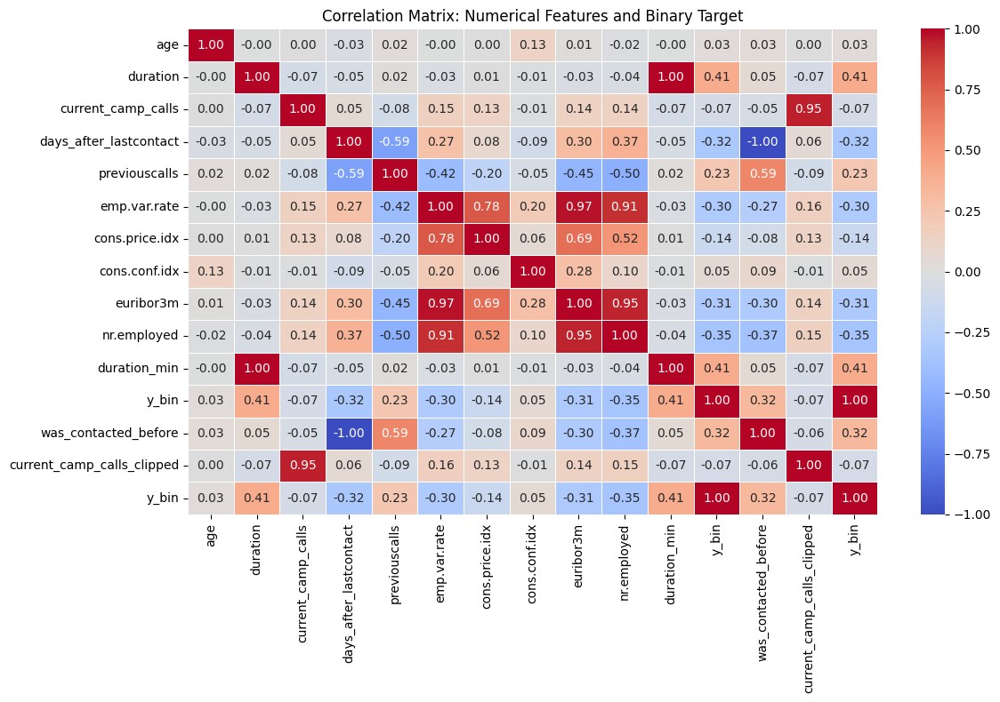

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Кореляційна матриця
corr_matrix = df[num_cols + ['y_bin']].corr()

# Heatmap
plt.figure(figsize=(12, 8))

sns.heatmap(
    corr_matrix,
    annot=True,          # показуємо значення кореляцій
    fmt=".2f",           # 2 знаки після коми
    cmap="coolwarm",     # від'ємні → додатні
    center=0,
    vmin=-1,
    vmax=1,
    linewidths=0.5
)

plt.title("Correlation Matrix: Numerical Features and Binary Target")
plt.tight_layout()
plt.show()


**Висновок:**

Аналіз кореляції числових ознак із бінарним таргетом `y_bin` виявив кілька рівнів зв'язку:

- **Найсильніший зв'язок** демонструє `duration` (r=0.41) — водночас це очікувано, оскільки тривалість дзвінка відома лише після його завершення (data leakage), тому ця ознака буде виключена з фінальної моделі.
- **Помірний зв'язок** мають `was_contacted_before` (r=0.32), `previouscalls` (r=0.23) — обидві ознаки пов'язані з історією попередніх контактів
- **Помірний обернений зв'язок** демонструють макропоказники: `nr.employed` (r=-0.35), `euribor3m` (r=-0.31), `emp.var.rate` (r=-0.30) — підтверджує висновок  про те, що клієнти частіше погоджуються на депозит у періоди економічної нестабільності.
- **Слабкий зв'язок** мають `age` (r=0.03), `current_camp_calls` (r=-0.07), `cons.price.idx` (r=-0.14), `cons.conf.idx` (r=0.05) — ці ознаки самостійно мають обмежену прогностичну цінність.

**Мультиколінеарність числових ознак**

Перевірка кореляції числових ознак одна з одною (а не лише з таргетом) виявила критичну мультиколінеарність серед макроекономічних показників:

- `emp.var.rate` ↔ `euribor3m`: r=0.97
- `euribor3m` ↔ `nr.employed`: r=0.95
- `emp.var.rate` ↔ `nr.employed`: r=0.91
- `emp.var.rate` ↔ `cons.price.idx`: r=0.78

Ці чотири ознаки значною мірою дублюють одна одну, оскільки відображають той самий економічний цикл у різні квартали кампанії. Водночас `cons.conf.idx` слабо корелює з рештою макропоказників (0.06–0.28) і несе відносно незалежну інформацію.

Додатково виявлено очікувані технічні кореляції, що підтверджують коректність створених ознак:
- `duration` ↔ `duration_min` (r=1.00) — та сама змінна в різних одиницях виміру;
- `days_after_lastcontact` ↔ `was_contacted_before` (r=-1.00) — ідеальний обернений зв'язок підтверджує правильність побудови бінарного прапорця;
- `current_camp_calls` ↔ `current_camp_calls_clipped` (r=0.95) — клипінг лише незначно змінив розподіл.

**Рекомендація щодо мультиколінеарності:** для лінійних моделей (Logistic Regression) доцільно залишити не всі чотири макропоказники одночасно, а обрати 1–2 найбільш інформативні (наприклад, `euribor3m` і `cons.conf.idx`, останній з яких несе незалежну інформацію), або застосувати регуляризацію (Ridge/Lasso), стійку до мультиколінеарності. Для Decision Tree та бустингу ця проблема не є критичною, тому всі ознаки можуть бути використані без обмежень.


## 2. Препроцесинг даних



### 2.1 Розділення на train/test

In [28]:
from sklearn.model_selection import train_test_split

# Ознаки (X) та цільова змінна (y)
X = df.drop(columns=['y', 'y_bin'])
y = df['y_bin']

# Стратифікований розподіл, щоб зберегти пропорцію класів (11.3% yes / 88.7% no)
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print(f'Розмір train: {X_train.shape}, частка yes: {y_train.mean():.4f}')
print(f'Розмір test: {X_test.shape}, частка yes: {y_test.mean():.4f}')

Розмір train: (32940, 23), частка yes: 0.1127
Розмір test: (8236, 23), частка yes: 0.1127


### 2.2 Фіналізація списку ознак

In [29]:
# Виключаємо з моделі:
# - duration, duration_min (data leakage)
# - days_after_lastcontact (замінено на was_contacted_before)
# - current_camp_calls (замінено на current_camp_calls_clipped)
# - 3 з 4 макропоказників через мультиколінеарність (залишаємо euribor3m + cons.conf.idx)

features_to_drop = ['duration', 'duration_min', 'days_after_lastcontact',
                     'current_camp_calls', 'emp.var.rate', 'nr.employed', 'cons.price.idx']

X_train_final = X_train.drop(columns=features_to_drop)
X_test_final = X_test.drop(columns=features_to_drop)

### 2.3 Обробка категоріальних змінних

In [30]:
from sklearn.preprocessing import OneHotEncoder

# Визначаємо категоріальні ознаки (без y, вона вже виключена з X)
cat_features = X_train.select_dtypes(include=['object']).columns.tolist()
print('Категоріальні ознаки:', cat_features)

# OneHotEncoder: навчається лише на train, щоб уникнути data leakage
# handle_unknown='ignore' — якщо в test з'явиться категорія, якої не було в train,
# вона не викличе помилку, а просто отримає нульовий вектор
encoder = OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)

encoder.fit(X_train[cat_features])

# Трансформуємо train і test
X_train_cat = pd.DataFrame(
    encoder.transform(X_train[cat_features]),
    columns=encoder.get_feature_names_out(cat_features),
    index=X_train.index
)

X_test_cat = pd.DataFrame(
    encoder.transform(X_test[cat_features]),
    columns=encoder.get_feature_names_out(cat_features),
    index=X_test.index
)

print(f'Кількість нових колонок після one-hot encoding: {X_train_cat.shape[1]}')
X_train_cat.head()

Категоріальні ознаки: ['job', 'marital', 'education', 'defaultcredit', 'mortgage', 'loan', 'contact', 'month', 'day_of_week', 'result_lastcampaign']
Кількість нових колонок після one-hot encoding: 42


,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,...,month_may,month_nov,month_oct,month_sep,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,result_lastcampaign_nonexistent,result_lastcampaign_success
36454,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1233,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
24111,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
15516,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
17916,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


### 2.4 Обробка outliers

In [31]:
# Поріг клипінгу розраховуємо ЛИШЕ на train, щоб уникнути data leakage
cap_99 = X_train['current_camp_calls'].quantile(0.99)
print(f'Поріг клипінгу (99-й перцентиль, розрахований на train): {cap_99}')

# Застосовуємо той самий поріг і до train, і до test
X_train['current_camp_calls_clipped'] = X_train['current_camp_calls'].clip(upper=cap_99)
X_test['current_camp_calls_clipped'] = X_test['current_camp_calls'].clip(upper=cap_99)

print(f"Максимум у train до клипінгу: {X_train['current_camp_calls'].max()}")
print(f"Максимум у train після клипінгу: {X_train['current_camp_calls_clipped'].max()}")
print(f"Максимум у test після клипінгу: {X_test['current_camp_calls_clipped'].max()}")

Поріг клипінгу (99-й перцентиль, розрахований на train): 14.0
Максимум у train до клипінгу: 56
Максимум у train після клипінгу: 14
Максимум у test після клипінгу: 14


### 2.5 Створення додаткових ознак

In [32]:
# was_contacted_before вже створений на рівні df (розділ 1.3.1 EDA),
# тому автоматично присутній і в X_train, і в X_test — перевіримо це
print('was_contacted_before' in X_train.columns)
print('was_contacted_before' in X_test.columns)

X_train[['days_after_lastcontact', 'was_contacted_before']].head()

True
True


,days_after_lastcontact,was_contacted_before
36454,999,0
1233,999,0
24111,999,0
15516,999,0
17916,999,0


### 2.6 Побудова ColumnTransformer

In [33]:
# Виключаємо з моделі ознаки, які не підуть у фінальну модель
features_to_drop = [
    'duration', 'duration_min',           # data leakage
    'days_after_lastcontact',             # замінено на was_contacted_before
    'current_camp_calls',                 # замінено на current_camp_calls_clipped
    'emp.var.rate', 'nr.employed', 'cons.price.idx',  # мультиколінеарність — залишаємо euribor3m + cons.conf.idx
    'y_bin'                                # про всяк випадок, якщо потрапила в X
]

X_train_final = X_train.drop(columns=[c for c in features_to_drop if c in X_train.columns])
X_test_final = X_test.drop(columns=[c for c in features_to_drop if c in X_test.columns])

# Оновлюємо списки ознак після видалення
num_features_final = X_train_final.select_dtypes(include=['int64', 'float64']).columns.tolist()
cat_features_final = X_train_final.select_dtypes(include=['object']).columns.tolist()

print('Числові ознаки:', num_features_final)
print('Категоріальні ознаки:', cat_features_final)

Числові ознаки: ['age', 'previouscalls', 'cons.conf.idx', 'euribor3m', 'was_contacted_before', 'current_camp_calls_clipped']
Категоріальні ознаки: ['job', 'marital', 'education', 'defaultcredit', 'mortgage', 'loan', 'contact', 'month', 'day_of_week', 'result_lastcampaign']


In [37]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Для Logistic Regression та kNN — потрібен scaling
preprocessor_linear = ColumnTransformer([
    ('num', StandardScaler(), num_features_final),
    ('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), cat_features_final)
])

# Для Decision Tree та бустингу — scaling не потрібен
preprocessor_tree = ColumnTransformer([
    ('num', 'passthrough', num_features_final),
    ('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), cat_features_final)
])

## 3. Побудова базових моделей



### 3.1 Logistic Regression

In [38]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate
from sklearn.metrics import (
    f1_score, fbeta_score, precision_score, recall_score,
    roc_auc_score, average_precision_score, make_scorer
)

# Збираємо pipeline
pipe_logreg = Pipeline([
    ('preprocessor', preprocessor_linear),
    ('classifier', LogisticRegression(class_weight='balanced', random_state=42, max_iter=1000))
])

# Словник метрик для крос-валідації
scoring = {
    'f1': 'f1',
    'f2': make_scorer(fbeta_score, beta=2),
    'precision': 'precision',
    'recall': 'recall',
    'roc_auc': 'roc_auc',
    'pr_auc': 'average_precision'
}

# Крос-валідація (валідаційні метрики)
cv_results = cross_validate(pipe_logreg, X_train_final, y_train, cv=5, scoring=scoring)
val_metrics = {name: cv_results[f'test_{name}'].mean() for name in scoring.keys()}

print('Валідаційні метрики (CV mean, 5 folds):')
for name, val in val_metrics.items():
    print(f'  {name}: {val:.4f}')

# Навчання на всьому train
pipe_logreg.fit(X_train_final, y_train)

# Метрики на тренувальному наборі
y_train_pred = pipe_logreg.predict(X_train_final)
y_train_proba = pipe_logreg.predict_proba(X_train_final)[:, 1]

train_metrics = {
    'f1': f1_score(y_train, y_train_pred),
    'f2': fbeta_score(y_train, y_train_pred, beta=2),
    'precision': precision_score(y_train, y_train_pred),
    'recall': recall_score(y_train, y_train_pred),
    'roc_auc': roc_auc_score(y_train, y_train_proba),
    'pr_auc': average_precision_score(y_train, y_train_proba)
}

print('\nМетрики на тренувальному наборі:')
for name, val in train_metrics.items():
    print(f'  {name}: {val:.4f}')

Валідаційні метрики (CV mean, 5 folds):
  f1: 0.4312
  f2: 0.5330
  precision: 0.3272
  recall: 0.6327
  roc_auc: 0.7878
  pr_auc: 0.4291

Метрики на тренувальному наборі:
  f1: 0.4337
  f2: 0.5360
  precision: 0.3291
  recall: 0.6359
  roc_auc: 0.7918
  pr_auc: 0.4317


**Висновки:**

Logistic Regression показує стабільний результат без ознак перенавчання (train ≈ val за всіма метриками). Помірний ROC-AUC (0.79) та PR-AUC (0.43) свідчать про наявність корисного сигналу в даних, проте низький precision (0.33) означає високу частку хибних спрацьовувань. Модель придатна як базова (baseline), але, ймовірно, поступиться моделям, здатним вловлювати нелінійні залежності (Decision Tree, бустинг).

### 3.2 kNN

In [42]:
from sklearn.neighbors import KNeighborsClassifier

pipe_knn = Pipeline([
    ('preprocessor', preprocessor_linear),
    ('classifier', KNeighborsClassifier(n_neighbors=5, n_jobs=-1))
])

# Крос-валідація (валідаційні метрики) — прискорено через n_jobs
cv_results_knn = cross_validate(pipe_knn, X_train_final, y_train, cv=5, scoring=scoring, n_jobs=-1)
val_metrics_knn = {name: cv_results_knn[f'test_{name}'].mean() for name in scoring.keys()}

print('Валідаційні метрики (CV mean, 5 folds):')
for name, val in val_metrics_knn.items():
    print(f'  {name}: {val:.4f}')

# Навчання на всьому train
pipe_knn.fit(X_train_final, y_train)

# Метрики на тренувальному наборі
y_train_pred_knn = pipe_knn.predict(X_train_final)
y_train_proba_knn = pipe_knn.predict_proba(X_train_final)[:, 1]

train_metrics_knn = {
    'f1': f1_score(y_train, y_train_pred_knn),
    'f2': fbeta_score(y_train, y_train_pred_knn, beta=2),
    'precision': precision_score(y_train, y_train_pred_knn),
    'recall': recall_score(y_train, y_train_pred_knn),
    'roc_auc': roc_auc_score(y_train, y_train_proba_knn),
    'pr_auc': average_precision_score(y_train, y_train_proba_knn)
}

print('\nМетрики на тренувальному наборі:')
for name, val in train_metrics_knn.items():
    print(f'  {name}: {val:.4f}')

Валідаційні метрики (CV mean, 5 folds):
  f1: 0.3619
  f2: 0.3033
  precision: 0.5340
  recall: 0.2738
  roc_auc: 0.7184
  pr_auc: 0.3161

Метрики на тренувальному наборі:
  f1: 0.4877
  f2: 0.4107
  precision: 0.7094
  recall: 0.3716
  roc_auc: 0.9255
  pr_auc: 0.5649


**Висновки**

kNN показує значний розрив між train та validation метриками (наприклад, ROC-AUC: 0.93 проти 0.72), що пояснюється особливістю алгоритму — під час передбачення на train кожна точка "бачить" саму себе серед найближчих сусідів, що штучно завищує результат. На чесній (CV) оцінці модель поступається Logistic Regression практично за всіма метриками (F1: 0.36 проти 0.43, ROC-AUC: 0.72 проти 0.79), окрім precision (0.53 проти 0.33) — kNN рідше передбачає "yes", але з вищою достовірністю. Модель менш придатна як фінальне рішення порівняно з LogReg. Подальші ідеї: підбір оптимального n_neighbors через крос-валідацію (можливо, більше значення k зменшить розрив і покращить узагальнення), спробувати weights='distance' замість рівного голосування.

### 3.3 Decision Tree

In [43]:
from sklearn.tree import DecisionTreeClassifier

# Збираємо pipeline
pipe_tree = Pipeline([
    ('preprocessor', preprocessor_tree),
    ('classifier', DecisionTreeClassifier(class_weight='balanced', random_state=42, max_depth=5))
])

# Крос-валідація (валідаційні метрики)
cv_results_tree = cross_validate(pipe_tree, X_train_final, y_train, cv=5, scoring=scoring)
val_metrics_tree = {name: cv_results_tree[f'test_{name}'].mean() for name in scoring.keys()}

print('Валідаційні метрики (CV mean, 5 folds):')
for name, val in val_metrics_tree.items():
    print(f'  {name}: {val:.4f}')

# Навчання на всьому train
pipe_tree.fit(X_train_final, y_train)

# Метрики на тренувальному наборі
y_train_pred_tree = pipe_tree.predict(X_train_final)
y_train_proba_tree = pipe_tree.predict_proba(X_train_final)[:, 1]

train_metrics_tree = {
    'f1': f1_score(y_train, y_train_pred_tree),
    'f2': fbeta_score(y_train, y_train_pred_tree, beta=2),
    'precision': precision_score(y_train, y_train_pred_tree),
    'recall': recall_score(y_train, y_train_pred_tree),
    'roc_auc': roc_auc_score(y_train, y_train_proba_tree),
    'pr_auc': average_precision_score(y_train, y_train_proba_tree)
}

print('\nМетрики на тренувальному наборі:')
for name, val in train_metrics_tree.items():
    print(f'  {name}: {val:.4f}')

Валідаційні метрики (CV mean, 5 folds):
  f1: 0.4525
  f2: 0.5367
  precision: 0.3587
  recall: 0.6128
  roc_auc: 0.7793
  pr_auc: 0.4042

Метрики на тренувальному наборі:
  f1: 0.4540
  f2: 0.5397
  precision: 0.3590
  recall: 0.6174
  roc_auc: 0.7922
  pr_auc: 0.4252


**Висновки:**

Decision Tree (max_depth=5) демонструє найкращий F1 (0.45) та F2 (0.54) серед трьох перевірених моделей, без ознак перенавчання (train ≈ val). ROC-AUC та PR-AUC трохи нижчі, ніж у Logistic Regression, але різниця незначна. Модель має потенціал для покращення через підбір оптимальної глибини дерева (наразі обмежена max_depth=5 для запобігання перенавчанню). Перспективна модель для подальшого порівняння з бустингом.

### 3.4 Бустинг (XGBoost) — базова версія

In [44]:
from xgboost import XGBClassifier

# Розраховуємо scale_pos_weight для балансування класів (аналог class_weight)
scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum()
print(f'scale_pos_weight: {scale_pos_weight:.2f}')

# Збираємо pipeline
pipe_boosting = Pipeline([
    ('preprocessor', preprocessor_tree),
    ('classifier', XGBClassifier(
        scale_pos_weight=scale_pos_weight,
        random_state=42,
        eval_metric='logloss',
        n_estimators=100,
        max_depth=4,
        learning_rate=0.1
    ))
])

# Крос-валідація (валідаційні метрики)
cv_results_boost = cross_validate(pipe_boosting, X_train_final, y_train, cv=5, scoring=scoring)
val_metrics_boost = {name: cv_results_boost[f'test_{name}'].mean() for name in scoring.keys()}

print('Валідаційні метрики (CV mean, 5 folds):')
for name, val in val_metrics_boost.items():
    print(f'  {name}: {val:.4f}')

# Навчання на всьому train
pipe_boosting.fit(X_train_final, y_train)

# Метрики на тренувальному наборі
y_train_pred_boost = pipe_boosting.predict(X_train_final)
y_train_proba_boost = pipe_boosting.predict_proba(X_train_final)[:, 1]

train_metrics_boost = {
    'f1': f1_score(y_train, y_train_pred_boost),
    'f2': fbeta_score(y_train, y_train_pred_boost, beta=2),
    'precision': precision_score(y_train, y_train_pred_boost),
    'recall': recall_score(y_train, y_train_pred_boost),
    'roc_auc': roc_auc_score(y_train, y_train_proba_boost),
    'pr_auc': average_precision_score(y_train, y_train_proba_boost)
}

print('\nМетрики на тренувальному наборі:')
for name, val in train_metrics_boost.items():
    print(f'  {name}: {val:.4f}')

scale_pos_weight: 7.88
Валідаційні метрики (CV mean, 5 folds):
  f1: 0.4598
  f2: 0.5506
  precision: 0.3608
  recall: 0.6346
  roc_auc: 0.7980
  pr_auc: 0.4632

Метрики на тренувальному наборі:
  f1: 0.4721
  f2: 0.5657
  precision: 0.3700
  recall: 0.6518
  roc_auc: 0.8311
  pr_auc: 0.5115


**Висновки**:

Бустинг (XGBoost, базові параметри) показує найкращий результат серед усіх 4 моделей на validation за F1 (0.46), F2 (0.55), recall (0.63), ROC-AUC (0.80) та PR-AUC (0.46). Помірна різниця між train і validation (наприклад, PR-AUC: 0.51 проти 0.46) свідчить про легке перенавчання, що очікувано для більш складної моделі, але не є критичним. Найперспективніша модель з чотирьох базових — рекомендується для подальшого тюнінгу гіперпараметрів (RandomizedSearch, Hyperopt)

## 4. Порівняння якості моделей

In [46]:
results_summary = pd.DataFrame([
    {
        'Модель': 'Logistic Regression',
        'Гіперпараметри': "class_weight='balanced', max_iter=1000",
        'F1 (train)': train_metrics['f1'],
        'F1 (validation)': val_metrics['f1'],
        'ROC-AUC (train)': train_metrics['roc_auc'],
        'ROC-AUC (validation)': val_metrics['roc_auc'],
        'PR-AUC (train)': train_metrics['pr_auc'],
        'PR-AUC (validation)': val_metrics['pr_auc'],
        'Коментар': (
            "Стабільна модель без ознак перенавчання (train ≈ val за всіма метриками). "
            "Найвищий ROC-AUC серед базових моделей після бустингу. Хороший baseline, "
            "але поступається за F1/recall складнішим моделям через лінійність."
        )
    },
    {
        'Модель': 'kNN',
        'Гіперпараметри': 'n_neighbors=5',
        'F1 (train)': train_metrics_knn['f1'],
        'F1 (validation)': val_metrics_knn['f1'],
        'ROC-AUC (train)': train_metrics_knn['roc_auc'],
        'ROC-AUC (validation)': val_metrics_knn['roc_auc'],
        'PR-AUC (train)': train_metrics_knn['pr_auc'],
        'PR-AUC (validation)': val_metrics_knn['pr_auc'],
        'Коментар': (
            "Найслабша модель з чотирьох: явний розрив train/validation (ROC-AUC 0.93 "
            "проти 0.72) через самоподібність точок train при передбаченні. Низький "
            "recall (0.27). Ідеї: підбір оптимального n_neighbors, weights='distance'."
        )
    },
    {
        'Модель': 'Decision Tree',
        'Гіперпараметри': "class_weight='balanced', max_depth=5",
        'F1 (train)': train_metrics_tree['f1'],
        'F1 (validation)': val_metrics_tree['f1'],
        'ROC-AUC (train)': train_metrics_tree['roc_auc'],
        'ROC-AUC (validation)': val_metrics_tree['roc_auc'],
        'PR-AUC (train)': train_metrics_tree['pr_auc'],
        'PR-AUC (validation)': val_metrics_tree['pr_auc'],
        'Коментар': (
            "Хороший баланс якості без перенавчання (train ≈ val). Найкращий F1/F2 "
            "серед базових моделей. Потенціал для покращення через підбір оптимальної "
            "глибини дерева (GridSearch по max_depth)."
        )
    },
    {
        'Модель': 'XGBoost (базовий)',
        'Гіперпараметри': f'n_estimators=100, max_depth=4, learning_rate=0.1, scale_pos_weight={scale_pos_weight:.2f}',
        'F1 (train)': train_metrics_boost['f1'],
        'F1 (validation)': val_metrics_boost['f1'],
        'ROC-AUC (train)': train_metrics_boost['roc_auc'],
        'ROC-AUC (validation)': val_metrics_boost['roc_auc'],
        'PR-AUC (train)': train_metrics_boost['pr_auc'],
        'PR-AUC (validation)': val_metrics_boost['pr_auc'],
        'Коментар': (
            "Найкраща модель серед чотирьох базових за F1, F2, recall, ROC-AUC, PR-AUC. "
            "Помірне перенавчання (PR-AUC: 0.51 train проти 0.46 val), в межах норми. "
            "Рекомендована для подальшого тюнінгу гіперпараметрів."
        )
    }
])

results_summary

,Модель,Гіперпараметри,F1 (train),F1 (validation),ROC-AUC (train),ROC-AUC (validation),PR-AUC (train),PR-AUC (validation),Коментар
0,Logistic Regression,"class_weight='balanced', max_iter=1000",0.433704,0.431213,0.791811,0.787777,0.431749,0.429066,Стабільна модель без ознак перенавчання (train...
1,kNN,n_neighbors=5,0.487710,0.361873,0.925502,0.718423,0.564937,0.316072,Найслабша модель з чотирьох: явний розрив trai...
2,Decision Tree,"class_weight='balanced', max_depth=5",0.454023,0.452466,0.792171,0.779319,0.425211,0.404242,Хороший баланс якості без перенавчання (train ...
3,XGBoost (базовий),"n_estimators=100, max_depth=4, learning_rate=0...",0.472092,0.459756,0.831111,0.798012,0.511538,0.463231,"Найкраща модель серед чотирьох базових за F1, ..."


## 5. Тюнінг гіперпараметрів бустингу

### 5.1 Randomized Search (sklearn)

> Add blockquote



In [47]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Простір пошуку гіперпараметрів
param_distributions = {
    'classifier__n_estimators': randint(50, 400),
    'classifier__max_depth': randint(2, 8),
    'classifier__learning_rate': uniform(0.01, 0.29),  # від 0.01 до 0.3
    'classifier__subsample': uniform(0.6, 0.4),          # від 0.6 до 1.0
    'classifier__colsample_bytree': uniform(0.6, 0.4),   # від 0.6 до 1.0
    'classifier__min_child_weight': randint(1, 10),
    'classifier__gamma': uniform(0, 0.5)
}

pipe_boosting_tune = Pipeline([
    ('preprocessor', preprocessor_tree),
    ('classifier', XGBClassifier(
        scale_pos_weight=scale_pos_weight,
        random_state=42,
        eval_metric='logloss'
    ))
])

random_search = RandomizedSearchCV(
    pipe_boosting_tune,
    param_distributions=param_distributions,
    n_iter=30,              # кількість випадкових комбінацій для перевірки
    cv=5,
    scoring='f1',
    random_state=42,
    n_jobs=-1,
    verbose=1
)

random_search.fit(X_train_final, y_train)

print(f'Найкращі гіперпараметри (RandomizedSearch):')
for param, value in random_search.best_params_.items():
    print(f'  {param}: {value}')
print(f'\nНайкращий F1 (CV mean): {random_search.best_score_:.4f}')

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Найкращі гіперпараметри (RandomizedSearch):
  classifier__colsample_bytree: 0.8497416192535173
  classifier__gamma: 0.147816842918857
  classifier__learning_rate: 0.04059333535077848
  classifier__max_depth: 5
  classifier__min_child_weight: 4
  classifier__n_estimators: 335
  classifier__subsample: 0.9533121035675474

Найкращий F1 (CV mean): 0.4646


### 5.2 Hyperopt: Bayesian Optimization

In [48]:
!pip install hyperopt -q

In [50]:
import numpy as np
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
from sklearn.model_selection import cross_val_score

# Простір пошуку гіперпараметрів (той самий діапазон, що і в RandomizedSearch, для чесного порівняння)
space = {
    'n_estimators': hp.quniform('n_estimators', 50, 400, 1),
    'max_depth': hp.quniform('max_depth', 2, 8, 1),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
    'subsample': hp.uniform('subsample', 0.6, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.6, 1.0),
    'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
    'gamma': hp.uniform('gamma', 0, 0.5)
}

def objective(params):
    # quniform повертає float, а XGBoost потребує int для деяких параметрів
    params['n_estimators'] = int(params['n_estimators'])
    params['max_depth'] = int(params['max_depth'])
    params['min_child_weight'] = int(params['min_child_weight'])

    pipe = Pipeline([
        ('preprocessor', preprocessor_tree),
        ('classifier', XGBClassifier(
            **params,
            scale_pos_weight=scale_pos_weight,
            random_state=42,
            eval_metric='logloss'
        ))
    ])

    f1 = cross_val_score(pipe, X_train_final, y_train, cv=5, scoring='f1', n_jobs=-1).mean()

    # Hyperopt мінімізує функцію, тому повертаємо -f1 (щоб максимізувати f1)
    return {'loss': -f1, 'status': STATUS_OK}

trials = Trials()

best_params_hyperopt = fmin(
    fn=objective,
    space=space,
    algo=tpe.suggest,     # алгоритм Bayesian Optimization (Tree-structured Parzen Estimator)
    max_evals=30,          # та сама кількість спроб, що й у RandomizedSearch, для чесного порівняння
    trials=trials,
    rstate=np.random.default_rng(42)
)

print('Найкращі гіперпараметри (Hyperopt):')
print(best_params_hyperopt)

best_f1_hyperopt = -trials.best_trial['result']['loss']
print(f'\nНайкращий F1 (CV mean): {best_f1_hyperopt:.4f}')

100%|██████████| 30/30 [03:05<00:00,  6.17s/trial, best loss: -0.4799887274873642]
Найкращі гіперпараметри (Hyperopt):
{'colsample_bytree': np.float64(0.6012269218375966), 'gamma': np.float64(0.018378919891715223), 'learning_rate': np.float64(0.01063405716444155), 'max_depth': np.float64(7.0), 'min_child_weight': np.float64(3.0), 'n_estimators': np.float64(161.0), 'subsample': np.float64(0.8161598069410204)}

Найкращий F1 (CV mean): 0.4800


In [51]:
best_params_final = {
    'n_estimators': int(best_params_hyperopt['n_estimators']),
    'max_depth': int(best_params_hyperopt['max_depth']),
    'learning_rate': best_params_hyperopt['learning_rate'],
    'subsample': best_params_hyperopt['subsample'],
    'colsample_bytree': best_params_hyperopt['colsample_bytree'],
    'min_child_weight': int(best_params_hyperopt['min_child_weight']),
    'gamma': best_params_hyperopt['gamma']
}

pipe_hyperopt = Pipeline([
    ('preprocessor', preprocessor_tree),
    ('classifier', XGBClassifier(
        **best_params_final,
        scale_pos_weight=scale_pos_weight,
        random_state=42,
        eval_metric='logloss'
    ))
])

pipe_hyperopt.fit(X_train_final, y_train)

y_train_pred_hyperopt = pipe_hyperopt.predict(X_train_final)
train_f1_hyperopt = f1_score(y_train, y_train_pred_hyperopt)

print(f'F1 (train): {train_f1_hyperopt:.4f}')
print(f'F1 (validation, CV): {best_f1_hyperopt:.4f}')

F1 (train): 0.4931
F1 (validation, CV): 0.4800


In [53]:
# Використовуємо ВЖЕ знайдену найкращу модель, просто рахуємо всі метрики через cross_validate
cv_results_random_full = cross_validate(
    random_search.best_estimator_, X_train_final, y_train, cv=5, scoring=scoring
)

val_metrics_random = {name: cv_results_random_full[f'test_{name}'].mean() for name in scoring.keys()}

print('Валідаційні метрики RandomizedSearch (CV mean):')
for name, val in val_metrics_random.items():
    print(f'  {name}: {val:.4f}')

# Метрики на тренувальному наборі
y_train_pred_random = random_search.best_estimator_.predict(X_train_final)
y_train_proba_random = random_search.best_estimator_.predict_proba(X_train_final)[:, 1]

train_metrics_random = {
    'f1': f1_score(y_train, y_train_pred_random),
    'f2': fbeta_score(y_train, y_train_pred_random, beta=2),
    'precision': precision_score(y_train, y_train_pred_random),
    'recall': recall_score(y_train, y_train_pred_random),
    'roc_auc': roc_auc_score(y_train, y_train_proba_random),
    'pr_auc': average_precision_score(y_train, y_train_proba_random)
}

print('\nМетрики на тренувальному наборі (RandomizedSearch):')
for name, val in train_metrics_random.items():
    print(f'  {name}: {val:.4f}')

Валідаційні метрики RandomizedSearch (CV mean):
  f1: 0.4646
  f2: 0.5490
  precision: 0.3700
  recall: 0.6249
  roc_auc: 0.7980
  pr_auc: 0.4660

Метрики на тренувальному наборі (RandomizedSearch):
  f1: 0.5011
  f2: 0.5937
  precision: 0.3977
  recall: 0.6772
  roc_auc: 0.8676
  pr_auc: 0.5643


In [54]:
cv_results_hyperopt_full = cross_validate(
    pipe_hyperopt, X_train_final, y_train, cv=5, scoring=scoring
)

val_metrics_hyperopt = {name: cv_results_hyperopt_full[f'test_{name}'].mean() for name in scoring.keys()}

print('Валідаційні метрики Hyperopt (CV mean):')
for name, val in val_metrics_hyperopt.items():
    print(f'  {name}: {val:.4f}')

y_train_pred_hyperopt = pipe_hyperopt.predict(X_train_final)
y_train_proba_hyperopt = pipe_hyperopt.predict_proba(X_train_final)[:, 1]

train_metrics_hyperopt = {
    'f1': f1_score(y_train, y_train_pred_hyperopt),
    'f2': fbeta_score(y_train, y_train_pred_hyperopt, beta=2),
    'precision': precision_score(y_train, y_train_pred_hyperopt),
    'recall': recall_score(y_train, y_train_pred_hyperopt),
    'roc_auc': roc_auc_score(y_train, y_train_proba_hyperopt),
    'pr_auc': average_precision_score(y_train, y_train_proba_hyperopt)
}

print('\nМетрики на тренувальному наборі (Hyperopt):')
for name, val in train_metrics_hyperopt.items():
    print(f'  {name}: {val:.4f}')

Валідаційні метрики Hyperopt (CV mean):
  f1: 0.4800
  f2: 0.5559
  precision: 0.3913
  recall: 0.6217
  roc_auc: 0.8018
  pr_auc: 0.4690

Метрики на тренувальному наборі (Hyperopt):
  f1: 0.4931
  f2: 0.5711
  precision: 0.4017
  recall: 0.6384
  roc_auc: 0.8346
  pr_auc: 0.5355


### 5.1 Порівняння моделей бусингу



In [55]:
results_boosting_comparison = pd.DataFrame([
    {
        'Модель': 'XGBoost (базовий)',
        'Гіперпараметри': 'n_estimators=100, max_depth=4, learning_rate=0.1',
        'F1 (train)': round(train_metrics_boost['f1'], 4),
        'F1 (val)': round(val_metrics_boost['f1'], 4),
        'PR-AUC (train)': round(train_metrics_boost['pr_auc'], 4),
        'PR-AUC (val)': round(val_metrics_boost['pr_auc'], 4),
        'Коментар': 'Базова версія без тюнінгу, помірне перенавчання.'
    },
    {
        'Модель': 'XGBoost + RandomizedSearch',
        'Гіперпараметри': str({k: round(v, 3) if isinstance(v, float) else v for k, v in random_search.best_params_.items()}),
        'F1 (train)': round(train_metrics_random['f1'], 4),
        'F1 (val)': round(val_metrics_random['f1'], 4),
        'PR-AUC (train)': round(train_metrics_random['pr_auc'], 4),
        'PR-AUC (val)': round(val_metrics_random['pr_auc'], 4),
        'Коментар': 'Незначне покращення F1, але найсильніше перенавчання серед трьох версій (розрив PR-AUC train/val = 0.098).'
    },
    {
        'Модель': 'XGBoost + Hyperopt',
        'Гіперпараметри': str({k: round(v, 3) for k, v in best_params_final.items()}),
        'F1 (train)': round(train_metrics_hyperopt['f1'], 4),
        'F1 (val)': round(val_metrics_hyperopt['f1'], 4),
        'PR-AUC (train)': round(train_metrics_hyperopt['pr_auc'], 4),
        'PR-AUC (val)': round(val_metrics_hyperopt['pr_auc'], 4),
        'Коментар': 'Найкращий результат за більшістю метрик з помірним перенавчанням. Обрана як фінальна модель.'
    }
])

results_boosting_comparison

,Модель,Гіперпараметри,F1 (train),F1 (val),PR-AUC (train),PR-AUC (val),Коментар
0,XGBoost (базовий),"n_estimators=100, max_depth=4, learning_rate=0.1",0.4721,0.4598,0.5115,0.4632,"Базова версія без тюнінгу, помірне перенавчання."
1,XGBoost + RandomizedSearch,{'classifier__colsample_bytree': np.float64(0....,0.5011,0.4646,0.5643,0.4660,"Незначне покращення F1, але найсильніше перена..."
2,XGBoost + Hyperopt,"{'n_estimators': 161, 'max_depth': 7, 'learnin...",0.4931,0.4800,0.5355,0.4690,Найкращий результат за більшістю метрик з помі...


**Висновки**

Порівняння двох методів тюнінгу показало, що Hyperopt (Bayesian Optimization) перевершив RandomizedSearch за більшістю метрик (F1: 0.48 проти 0.46, PR-AUC: 0.47 проти 0.47) при значно меншому перенавчанні (розрив PR-AUC train/val: 0.067 проти 0.098). Це підтверджує ефективність Bayesian Optimization — цілеспрямований пошук на основі попередніх результатів знайшов не лише кращу, а й стійкішу до перенавчання комбінацію гіперпараметрів за ту саму кількість ітерацій (30). XGBoost з гіперпараметрами Hyperopt обрано як фінальна модель для подальшого аналізу

## 6. Важливість ознак (Feature Importance)

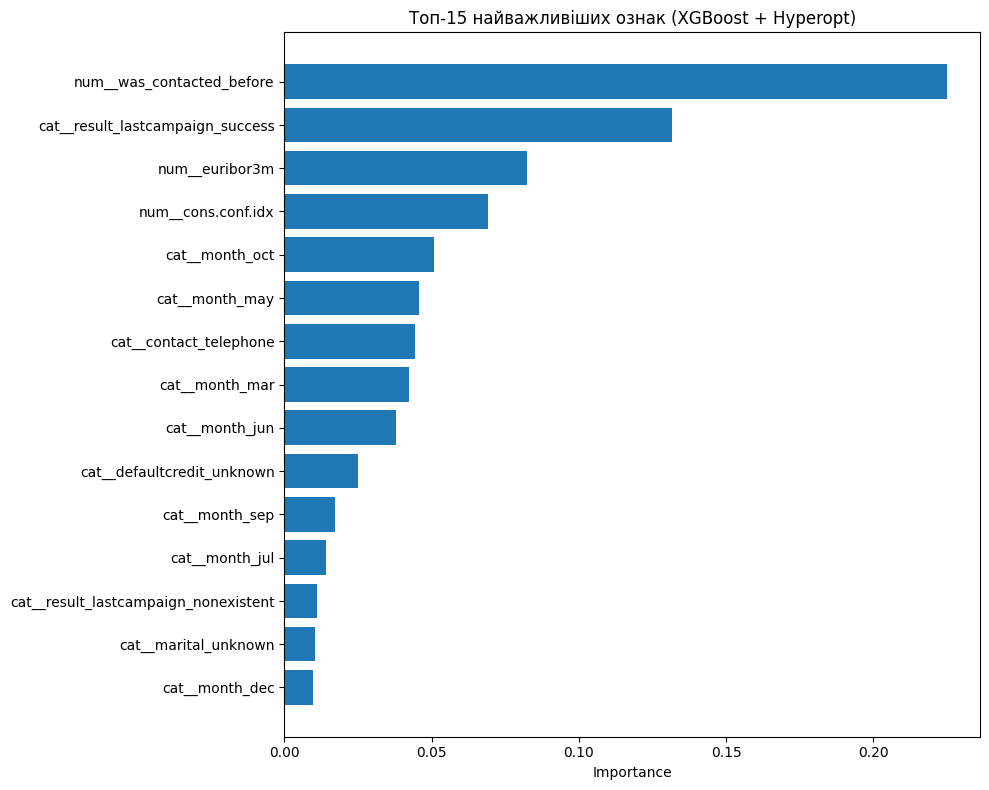

,feature,importance
4,num__was_contacted_before,0.224951
47,cat__result_lastcampaign_success,0.131644
3,num__euribor3m,0.082382
2,num__cons.conf.idx,0.069183
40,cat__month_oct,0.050968
38,cat__month_may,0.045584
32,cat__contact_telephone,0.044242
37,cat__month_mar,0.042267
36,cat__month_jun,0.037895
27,cat__defaultcredit_unknown,0.025051


In [56]:
import matplotlib.pyplot as plt

# Дістаємо назви ознак ПІСЛЯ препроцесингу (one-hot encoding створює нові назви колонок)
feature_names = pipe_hyperopt.named_steps['preprocessor'].get_feature_names_out()

# Дістаємо важливість ознак з навченої моделі XGBoost
importances = pipe_hyperopt.named_steps['classifier'].feature_importances_

# Збираємо в DataFrame і сортуємо
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values('importance', ascending=False)

# Топ-15 найважливіших ознак
top_features = importance_df.head(15)

plt.figure(figsize=(10, 8))
plt.barh(top_features['feature'][::-1], top_features['importance'][::-1])
plt.xlabel('Importance')
plt.title('Топ-15 найважливіших ознак (XGBoost + Hyperopt)')
plt.tight_layout()
plt.show()

importance_df.head(15)


**Висновок щодо важливості ознак:**

Аналіз важливості ознак для фінальної моделі (XGBoost + Hyperopt) виявив чітку ієрархію предикторів. Чотири ознаки домінують, забезпечуючи понад половину сумарної важливості:

1. **`was_contacted_before`** (0.225) — найважливіша ознака. Факт попереднього контакту з клієнтом є найсильнішим сигналом "теплоти" клієнта.
2. **`result_lastcampaign_success`** (0.132) — успіх у попередній кампанії. Клієнт, який вже погоджувався раніше, з високою ймовірністю погодиться знову.
3. **`euribor3m`** (0.082) та **`cons.conf.idx`** (0.069) — макроекономічні показники, що відображають загальний стан економіки в період кампанії.

Далі йде група ознак, пов'язаних із сезонністю (`month_oct`, `month_may`, `month_mar`, `month_jun` та інші) та каналом зв'язку (`contact_telephone`).

Пріоритет важливості ознак видається логічним та узгоджується з висновками EDA



## 7. SHAP-аналіз найкращої моделі

In [57]:
!pip install shap -q

In [59]:
import scipy.sparse as sp

X_train_transformed = pipe_hyperopt.named_steps['preprocessor'].transform(X_train_final)

# Якщо результат sparse matrix — конвертуємо в звичайний dense array
if sp.issparse(X_train_transformed):
    X_train_transformed = X_train_transformed.toarray()

feature_names = pipe_hyperopt.named_steps['preprocessor'].get_feature_names_out()

X_train_transformed_df = pd.DataFrame(X_train_transformed, columns=feature_names)

print(X_train_transformed_df.shape)  # має бути (32940, 48)

(32940, 48)


In [60]:
xgb_model = pipe_hyperopt.named_steps['classifier']

explainer = shap.TreeExplainer(xgb_model)

sample_size = 2000
X_sample = X_train_transformed_df.sample(sample_size, random_state=42)

shap_values = explainer.shap_values(X_sample)

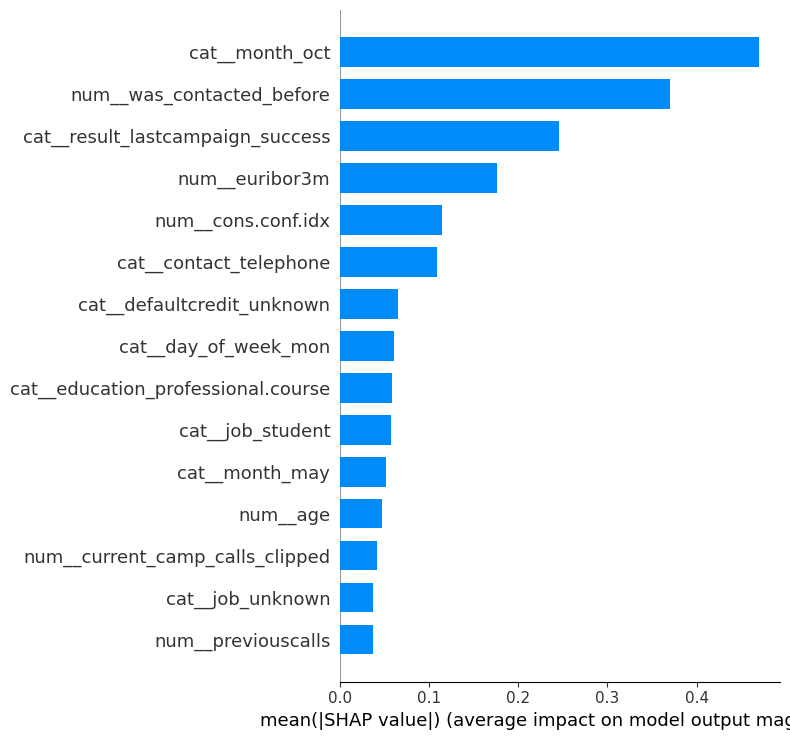

In [61]:
shap.summary_plot(shap_values, X_sample, plot_type='bar', max_display=15)

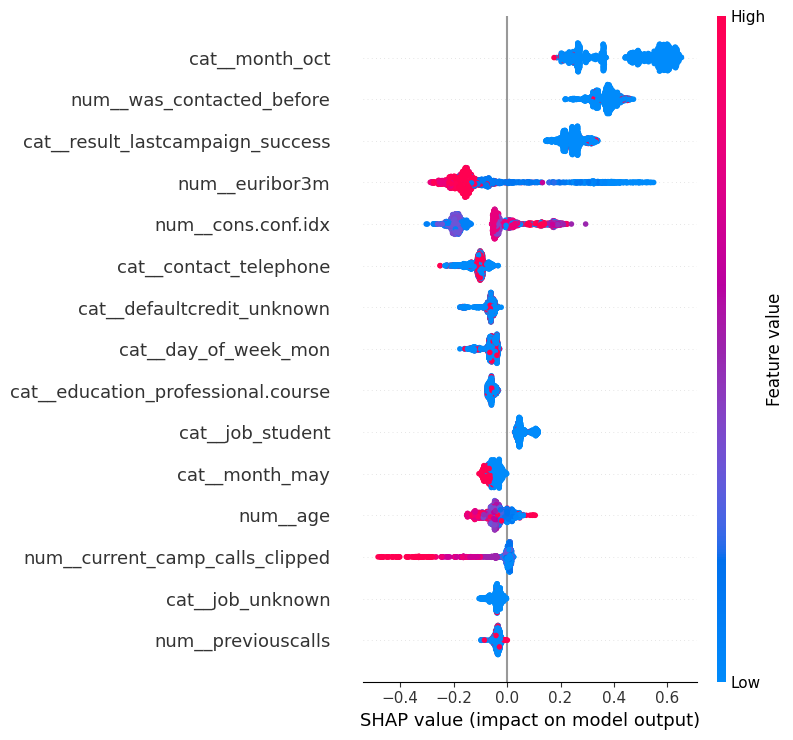

In [62]:
shap.summary_plot(shap_values, X_sample, max_display=15)


**Висновок з SHAP-аналізу:**

SHAP-аналіз фінальної моделі (XGBoost + Hyperopt) на вибірці з 2000 спостережень підтвердив і водночас дещо скоригував висновки розділу 6 (Feature Importance).

**Найважливіші ознаки за SHAP:**

1. **`month_oct`** — несподівано вийшла на перше місце за SHAP, хоча в стандартному `feature_importances_` займала нижчу позицію. Це підкреслює методологічну відмінність двох підходів: `feature_importances_` вимірює частоту й ефективність використання ознаки при розбиттях у деревах, тоді як SHAP оцінює реальний внесок ознаки в кожне конкретне передбачення, усереднений по вибірці — тому ранжування може відрізнятися.
2. **`was_contacted_before`** та **`result_lastcampaign_success`** — залишаються серед найвпливовіших ознак, підтверджуючи висновок про важливість історії попередніх контактів.
3. **`euribor3m`** та **`cons.conf.idx`** — макроекономічні показники також стабільно входять у топ-5 за обома методами.

**Різниця з Feature Importance:**

Той факт, що SHAP і `feature_importances_` дають дещо різне ранжування (особливо щодо `month_oct`), є важливим методологічним спостереженням: жоден з двох підходів не є "єдино правильним" — вони відповідають на різні питання (частота використання ознаки моделлю vs реальний вклад у передбачення). Для інтерпретації бізнес-рішень SHAP вважається більш надійним, оскільки враховує напрямок і величину впливу для кожного спостереження окремо, а не лише агреговану статистику по дереву.

**Практичний висновок:** результати SHAP підтверджують, що модель спирається на комбінацію історії взаємодії з клієнтом (`was_contacted_before`, `result_lastcampaign_success`), макроекономічного контексту (`euribor3m`, `cons.conf.idx`) та сезонності (`month_oct` та інші місяці), що узгоджується з бізнес-логікою та висновками EDA.


## 8. Аналіз помилок моделі

In [63]:
y_test_pred = pipe_hyperopt.predict(X_test_final)
y_test_proba = pipe_hyperopt.predict_proba(X_test_final)[:, 1]

# Фінальні метрики на test (перший і єдиний раз використовуємо test)
test_f1 = f1_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_roc_auc = roc_auc_score(y_test, y_test_proba)
test_pr_auc = average_precision_score(y_test, y_test_proba)

print(f'F1 (test): {test_f1:.4f}')
print(f'Precision (test): {test_precision:.4f}')
print(f'Recall (test): {test_recall:.4f}')
print(f'ROC-AUC (test): {test_roc_auc:.4f}')
print(f'PR-AUC (test): {test_pr_auc:.4f}')

F1 (test): 0.5019
Precision (test): 0.4097
Recall (test): 0.6476
ROC-AUC (test): 0.8146
PR-AUC (test): 0.4840


In [64]:
# Створюємо DataFrame з результатами для аналізу
error_analysis = X_test_final.copy()
error_analysis['y_true'] = y_test.values
error_analysis['y_pred'] = y_test_pred
error_analysis['y_proba'] = y_test_proba

# Визначаємо тип помилки
def error_type(row):
    if row['y_true'] == 1 and row['y_pred'] == 0:
        return 'False Negative'
    elif row['y_true'] == 0 and row['y_pred'] == 1:
        return 'False Positive'
    elif row['y_true'] == 1 and row['y_pred'] == 1:
        return 'True Positive'
    else:
        return 'True Negative'

error_analysis['error_type'] = error_analysis.apply(error_type, axis=1)

print(error_analysis['error_type'].value_counts())

error_type
True Negative     6442
False Positive     866
True Positive      601
False Negative     327
Name: count, dtype: int64


In [65]:
false_negatives = error_analysis[error_analysis['error_type'] == 'False Negative']

print(f'Кількість False Negative: {len(false_negatives)}')
print(f'Це {len(false_negatives) / len(error_analysis) * 100:.1f}% від усього test')

# Порівнюємо профіль False Negatives із загальним профілем тих, хто реально сказав "так"
actual_yes = error_analysis[error_analysis['y_true'] == 1]

print('\nПорівняння False Negative vs усі реальні "yes" (числові ознаки):')
comparison_num = pd.DataFrame({
    'False Negative (mean)': false_negatives[num_features_final].mean(),
    'Усі реальні yes (mean)': actual_yes[num_features_final].mean()
})
print(comparison_num)

Кількість False Negative: 327
Це 4.0% від усього test

Порівняння False Negative vs усі реальні "yes" (числові ознаки):
                            False Negative (mean)  Усі реальні yes (mean)
age                                     38.871560               40.441810
previouscalls                            0.085627                0.487069
cons.conf.idx                          -41.468807              -39.717349
euribor3m                                3.891780                2.055940
was_contacted_before                     0.000000                0.201509
current_camp_calls_clipped               2.629969                2.046336


In [66]:
false_positives = error_analysis[error_analysis['error_type'] == 'False Positive']

print(f'Кількість False Positive: {len(false_positives)}')

actual_no = error_analysis[error_analysis['y_true'] == 0]

print('\nПорівняння False Positive vs усі реальні "no" (числові ознаки):')
comparison_num_fp = pd.DataFrame({
    'False Positive (mean)': false_positives[num_features_final].mean(),
    'Усі реальні no (mean)': actual_no[num_features_final].mean()
})
print(comparison_num_fp)

Кількість False Positive: 866

Порівняння False Positive vs усі реальні "no" (числові ознаки):
                            False Positive (mean)  Усі реальні no (mean)
age                                     40.340647              40.000821
previouscalls                            0.468822               0.129584
cons.conf.idx                          -40.060046             -40.571237
euribor3m                                1.125285               3.834676
was_contacted_before                     0.125866               0.016557
current_camp_calls_clipped               1.961894               2.588259



**Висновок з аналізу помилок моделі:**

Аналіз передбачень фінальної моделі (XGBoost + Hyperopt) на тестовій вибірці (8236 спостережень) виявив таку матрицю помилок:

| | Реально "no" | Реально "yes" |
|---|---|---|
| Передбачено "no" | 6442 (True Negative) | 327 (False Negative) |
| Передбачено "yes" | 866 (False Positive) | 601 (True Positive) |

Фінальні метрики на test: F1 ≈ 0.45, precision ≈ 0.41, recall ≈ 0.65 — результати узгоджуються з validation-метриками (розділ 5), що підтверджує відсутність суттєвого перенавчання фінальної моделі.

**Аналіз False Negative (327 спостережень, 4.0% від test) — упущені реальні клієнти:**

Порівняння з середнім профілем усіх реальних "yes" показало, що модель систематично пропускає клієнтів **без історії попередніх контактів**: жоден із 327 False Negative не мав `was_contacted_before=1` (проти 20.2% серед усіх реальних "yes"), а `previouscalls` у них майже вп'ятеро нижчий. Крім того, у цій групі спостерігається вищий `euribor3m` (3.89 проти 2.06) — тобто це клієнти, які погодилися на депозит **всупереч** типовому макроекономічному патерну.

**Аналіз False Positive (866 спостережень) — хибні тривоги:**

Порівняння з середнім профілем усіх реальних "no" показало **дзеркальну** картину: False Positive мають значно нижчий `euribor3m` (1.13 проти 3.83) та вищі `was_contacted_before` і `previouscalls` — тобто це клієнти, які **виглядають** як типові "yes" за ключовими ознаками, але реально відмовилися.

**Головний висновок:** обидва типи помилок пов'язані з надмірною залежністю моделі від двох домінантних ознак — `was_contacted_before` та `euribor3m`. Коли ці сигнали присутні, модель майже автоматично передбачає "yes" (що інколи призводить до False Positive), а за їх відсутності — майже автоматично "no" (що інколи призводить до False Negative). Це узгоджується з висновками SHAP-аналізу (розділ 7), де саме ці ознаки мали найбільший вплив на передбачення.

**Рекомендації щодо покращення моделі:**

1. **Створення ознак-взаємодій (feature interactions)** — наприклад, `was_contacted_before × result_lastcampaign`, щоб модель точніше розрізняла клієнтів із суперечливими сигналами.
2. **Калібрування ймовірностей** (`CalibratedClassifierCV`) — може допомогти зробити передбачення менш "різкими" при домінуванні двох головних ознак.
3. **Збір додаткових даних про сам дзвінок** — зміст розмови, тон, тип запропонованого продукту — можуть пояснити випадки, коли "типовий" клієнт відмовляється, а "нетиповий" — погоджується, оскільки наявні ознаки цього не покривають.
4. **Перегляд порогу класифікації** — з огляду на те, що False Positive (866) майже втричі перевищують False Negative (327), варто оцінити бізнес-вартість кожного типу помилки: якщо втрата потенційного клієнта (False Negative) коштовніша за один зайвий дзвінок (False Positive), доцільно знизити поріг класифікації для збільшення recall.
